In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/FireSegmentation/FireSeg_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/FireSegmentation/FireSeg_masks.npy')

In [3]:
images.shape

(26333, 512, 512, 1)

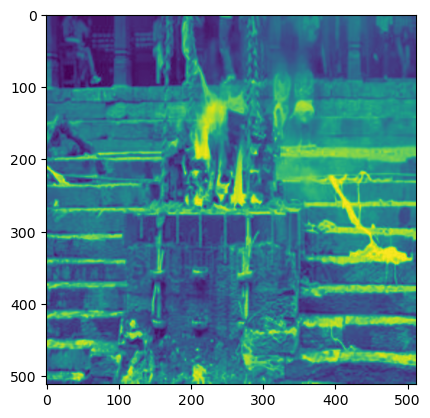

In [4]:
imshow(images[1])

In [5]:
masks.shape

(26333, 512, 512, 1)

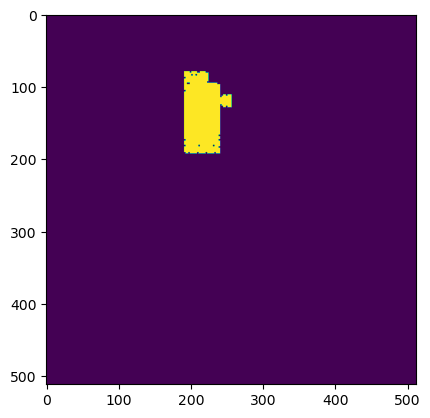

In [6]:
imshow(masks[1])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpx71z76e4kuc_unet2d


In [11]:
hist = C.train(images[0:10000], masks[0:10000], images[10000:12000], masks[10000:12000], batch_size=16, patience_counter=4)

Epoch 1/100
625/625 [==============================] - 178s 269ms/step - loss: 0.1542 - dice_coeff: 0.0439 - val_loss: 0.1337 - val_dice_coeff: 0.0692
Epoch 2/100
625/625 [==============================] - 168s 268ms/step - loss: 0.1296 - dice_coeff: 0.0814 - val_loss: 0.1343 - val_dice_coeff: 0.0703
Epoch 3/100
625/625 [==============================] - 168s 269ms/step - loss: 0.1115 - dice_coeff: 0.1785 - val_loss: 0.1132 - val_dice_coeff: 0.2509
Epoch 4/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0717 - dice_coeff: 0.4378 - val_loss: 0.0927 - val_dice_coeff: 0.3473
Epoch 5/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0576 - dice_coeff: 0.5409 - val_loss: 0.0842 - val_dice_coeff: 0.3985
Epoch 6/100
625/625 [==============================] - 169s 270ms/step - loss: 0.0507 - dice_coeff: 0.5924 - val_loss: 0.0869 - val_dice_coeff: 0.3665
Epoch 7/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0461 - dice_c

Epoch 55/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0107 - dice_coeff: 0.9102 - val_loss: 0.1340 - val_dice_coeff: 0.4949
Epoch 56/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0107 - dice_coeff: 0.9098 - val_loss: 0.1584 - val_dice_coeff: 0.4643
Epoch 57/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0107 - dice_coeff: 0.9096 - val_loss: 0.1538 - val_dice_coeff: 0.4803
Epoch 58/100
625/625 [==============================] - 168s 270ms/step - loss: 0.0099 - dice_coeff: 0.9163 - val_loss: 0.1913 - val_dice_coeff: 0.4605
Epoch 59/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0097 - dice_coeff: 0.9182 - val_loss: 0.1719 - val_dice_coeff: 0.4778
Epoch 60/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0098 - dice_coeff: 0.9176 - val_loss: 0.1571 - val_dice_coeff: 0.4548
Epoch 61/100
625/625 [==============================] - 168s 269ms/step - loss: 0.0100 -

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

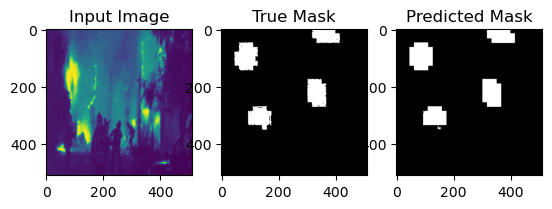

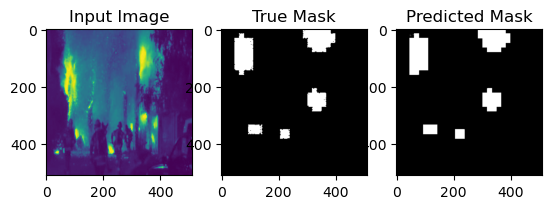

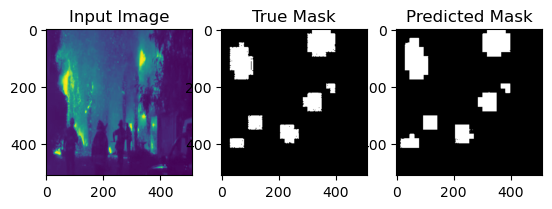

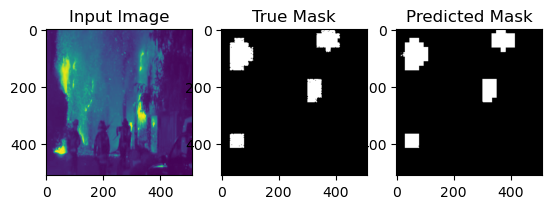

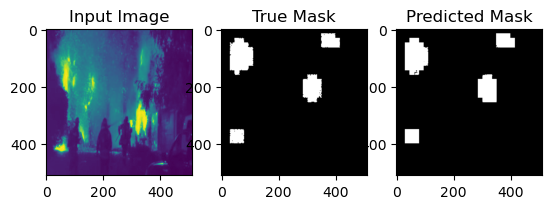

...

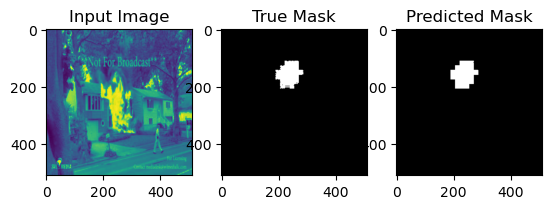

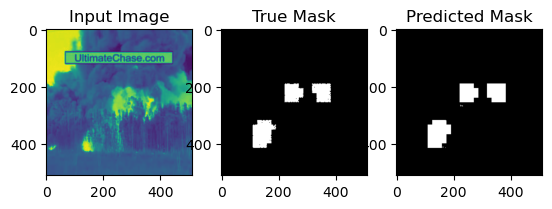

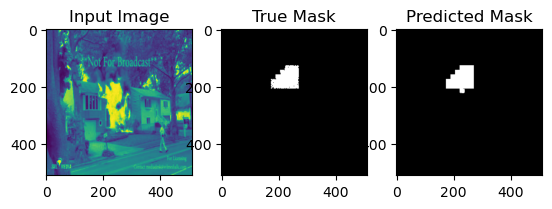

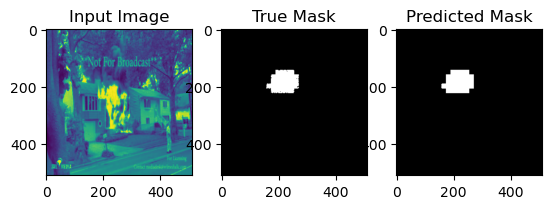

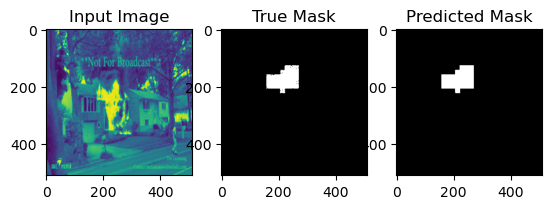

In [13]:
visualize_predictions(C, images[10000:12000], masks[10000:12000], num_samples=200)